<a href="https://colab.research.google.com/github/KevinChan1024/endo-projects/blob/main/endo-test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

以下是数据集解压与随机提取的代码，不需要运行

In [ ]:
# 1. 挂载 Google Drive
from google.colab import drive
import os

# 挂载云端硬盘
drive.mount('/content/drive')

# 确认文件是否存在 (根据您提供的路径)
zip_file_path = '/content/drive/MyDrive/datasets/Nvidia_Fallingthings_Dataset/fat.zip'

if os.path.exists(zip_file_path):
    print(f"成功找到文件: {zip_file_path}")
else:
    print(f"错误: 未找到文件，请检查路径: {zip_file_path}")

Mounted at /content/drive
成功找到文件: /content/drive/MyDrive/datasets/Nvidia_Fallingthings_Dataset/fat.zip


In [ ]:
# 2. 检查并输出压缩文件里的路径
import zipfile

# 目标子文件夹列表 (根据您的描述)
target_subfolders = [
    'kitchen_0', 'kitchen_1', 'kitchen_2', 'kitchen_3', 'kitchen_4',
    'kitedemo_0', 'kitedemo_1', 'kitedemo_2', 'kitedemo_3', 'kitedemo_4',
    'temple_0', 'temple_1', 'temple_2', 'temple_3', 'temple_4'
]

# 用于存储 zip 内部结构的字典
folder_structure = {}

try:
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        # 获取所有文件列表
        all_files = zip_ref.namelist()

        print(f"压缩包内文件总数: {len(all_files)}")

        # 简单打印前几个文件以确认根目录结构 (例如是否是以 fat/mixed 开头)
        print("压缩包内前 5 个文件路径示例:")
        for f in all_files[:5]:
            print(f)

        # 验证这15个文件夹是否存在
        print("\n--- 正在验证目标文件夹 ---")
        for sub in target_subfolders:
            # 构造预期的路径前缀 (根据您的描述是 fat/mixed/...)
            prefix = f"fat/mixed/{sub}/"
            # 检查是否有文件以该前缀开头
            has_files = any(f.startswith(prefix) for f in all_files)
            if has_files:
                print(f"√ 确认存在: {sub}")
            else:
                print(f"× 未找到: {sub} (请检查路径前缀是否正确)")

except Exception as e:
    print(f"读取压缩文件出错: {e}")

压缩包内文件总数: 493014
压缩包内前 5 个文件路径示例:
fat/
fat/mixed/
fat/mixed/kitchen_0/
fat/mixed/kitchen_0/000000.left.depth.png
fat/mixed/kitchen_0/000000.left.jpg

--- 正在验证目标文件夹 ---
√ 确认存在: kitchen_0
√ 确认存在: kitchen_1
√ 确认存在: kitchen_2
√ 确认存在: kitchen_3
√ 确认存在: kitchen_4
√ 确认存在: kitedemo_0
√ 确认存在: kitedemo_1
√ 确认存在: kitedemo_2
√ 确认存在: kitedemo_3
√ 确认存在: kitedemo_4
√ 确认存在: temple_0
√ 确认存在: temple_1
√ 确认存在: temple_2
√ 确认存在: temple_3
√ 确认存在: temple_4


In [ ]:
# 3. 设置文件保存路径
import os

# 设置解压的目标根目录
# 您可以修改这个路径，比如改成 '/content/drive/MyDrive/extracted_fat' 直接解压回云端硬盘（速度会慢一些）
# 或者保留在 '/content/extracted_dataset' (Colab 本地，速度快)
extraction_root = '/content/extracted_dataset'

if not os.path.exists(extraction_root):
    os.makedirs(extraction_root)
    print(f"已创建目标目录: {extraction_root}")
else:
    print(f"目标目录已存在: {extraction_root}")

print(f"准备开始解压...")

已创建目标目录: /content/extracted_dataset
准备开始解压...


In [ ]:
# 4. 开始随机解压文件 (新需求版本)
import random
import zipfile
import os

# 之前定义的 zip 文件路径 (确保此变量在内存中，或重新定义)
zip_file_path = '/content/drive/MyDrive/datasets/Nvidia_Fallingthings_Dataset/fat.zip'

# 15个目标子文件夹
target_subfolders = [
    'kitchen_0', 'kitchen_1', 'kitchen_2', 'kitchen_3', 'kitchen_4',
    'kitedemo_0', 'kitedemo_1', 'kitedemo_2', 'kitedemo_3', 'kitedemo_4',
    'temple_0', 'temple_1', 'temple_2', 'temple_3', 'temple_4'
]

# 【修改点】仅保留需要的4种文件后缀
suffixes = [
    ".left.depth.png",
    ".left.jpg",
    ".right.depth.png",
    ".right.jpg"
]

# 设置随机种子
random.seed(42)

try:
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        # 获取 zip 内所有文件列表的集合，查找速度更快
        print("正在读取文件列表，请稍候...")
        all_files_set = set(zip_ref.namelist())

        for subfolder_name in target_subfolders:
            print(f"\n正在处理文件夹: {subfolder_name} ...")

            # 基础路径前缀
            base_path = f"fat/mixed/{subfolder_name}/"

            # --- 1. 解压配置文件 (保持不变) ---
            config_files = ["_camera_settings.json", "_object_settings.json"]
            for cfg in config_files:
                cfg_path = base_path + cfg
                if cfg_path in all_files_set:
                    zip_ref.extract(cfg_path, path=extraction_root)
                else:
                    print(f"  警告: 未找到配置文件 {cfg_path}")

            # --- 2. 随机抽取 100 份数据 ---
            # 生成 000000 - 001999 的所有 ID
            all_ids = [f"{i:06d}" for i in range(2000)]

            # 【修改点】随机采样 100 个
            sampled_ids = random.sample(all_ids, 100)

            print(f"  已随机选中 100 个 ID，准备解压...")

            files_to_extract = []

            # 构建文件列表
            for img_id in sampled_ids:
                for suffix in suffixes:
                    # 拼接完整路径，例如 fat/mixed/kitchen_0/000123.left.jpg
                    file_path = f"{base_path}{img_id}{suffix}"

                    # 确认文件在压缩包里再添加
                    if file_path in all_files_set:
                        files_to_extract.append(file_path)

            # 批量执行解压
            if files_to_extract:
                # 这一步会把文件解压到 extraction_root/fat/mixed/kitchen_0/...
                # 自动保持原有的目录结构
                zip_ref.extractall(path=extraction_root, members=files_to_extract)
                print(f"  √ 成功解压 {len(files_to_extract)} 个图像文件")
            else:
                print("  ! 未找到匹配的文件")

    print(f"\n========================================")
    print(f"所有任务完成！文件已保存至: {extraction_root}/fat/mixed/")

except Exception as e:
    print(f"解压过程中发生错误: {e}")

正在读取文件列表，请稍候...

正在处理文件夹: kitchen_0 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: kitchen_1 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: kitchen_2 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: kitchen_3 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: kitchen_4 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: kitedemo_0 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: kitedemo_1 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: kitedemo_2 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: kitedemo_3 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: kitedemo_4 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: temple_0 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: temple_1 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: temple_2 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: temple_3 ...
  已随机选中 100 个 ID，准备解压...
  √ 成功解压 400 个图像文件

正在处理文件夹: temple_4 ...
  已随机选中 

In [ ]:
import shutil
import os

# 1. 定义路径
source_dir = '/content/extracted_dataset'  # 刚才解压的临时目录
output_filename = 'fat_subset_100'         # 新压缩包的名字 (不带后缀)
local_zip_path = f'/content/{output_filename}.zip' # Colab 本地的临时压缩包路径

# Google Drive 的目标保存路径
drive_save_dir = '/content/drive/MyDrive/datasets/Nvidia_Fallingthings_Dataset/'
final_drive_path = os.path.join(drive_save_dir, f'{output_filename}.zip')

# 2. 开始压缩 (压缩 fat 文件夹)
print("正在将筛选后的数据压缩...")
# base_dir=source_dir 表示将该目录下的内容（即 fat 文件夹）作为压缩包的根目录
shutil.make_archive(f'/content/{output_filename}', 'zip', root_dir=source_dir)
print(f"压缩完成，临时文件位于: {local_zip_path}")

# 3. 移动到 Google Drive
print(f"正在上传至 Google Drive: {drive_save_dir} ...")

if os.path.exists(drive_save_dir):
    shutil.copy(local_zip_path, final_drive_path)
    print("------------------------------------------------------")
    print("✅ 成功！文件已保存至您的云端硬盘：")
    print(final_drive_path)
    print("------------------------------------------------------")
else:
    print(f"❌ 错误：找不到目标目录 {drive_save_dir}，请检查路径是否正确。")

正在将筛选后的数据压缩...
压缩完成，临时文件位于: /content/fat_subset_100.zip
正在上传至 Google Drive: /content/drive/MyDrive/datasets/Nvidia_Fallingthings_Dataset/ ...
------------------------------------------------------
✅ 成功！文件已保存至您的云端硬盘：
/content/drive/MyDrive/datasets/Nvidia_Fallingthings_Dataset/fat_subset_100.zip
------------------------------------------------------


In [ ]:
以下是解压数据集的代码，每次进入colab，先运行这个

In [2]:
from google.colab import drive
import os
import zipfile

# 1. 挂载云端硬盘
drive.mount('/content/drive')

# 2. 定义路径
# 这是我们在上一步生成的新文件路径
zip_file_path = '/content/drive/MyDrive/datasets/Nvidia_Fallingthings_Dataset/fat_subset_100.zip'
extract_to = '/content/dataset' # 解压到 Colab 本地的新位置

# 3. 解压文件
if os.path.exists(zip_file_path):
    print(f"找到文件: {zip_file_path}")
    print("正在解压，请稍候...")

    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

    print(f"✅ 解压完成！数据位于: {extract_to}/fat/mixed/")
else:
    print(f"❌ 未找到文件: {zip_file_path}，请检查云端硬盘中是否已成功生成该文件。")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
找到文件: /content/drive/MyDrive/datasets/Nvidia_Fallingthings_Dataset/fat_subset_100.zip
正在解压，请稍候...
✅ 解压完成！数据位于: /content/dataset/fat/mixed/


景深模糊仿真。逻辑是根据离焦深度施加不同程度的模糊，离焦深度越大，图像越模糊。然后为了保证，景深不会太薄，就设置一个coc_threshold_px，小于这个值的都是清晰。此外，由于左目是高分辨，右目是低分辨，为了体现这两个图像分辨率的差距，会设置一个base_blur_px，从而降低右目分辨率。

In [ ]:
import numpy as np
import cv2

# ==========================================
# 1. 系统参数配置
# ==========================================
FAT_FX = 768.16
FAT_BASELINE = 0.06

def simulate_layered_dof(img, depth_map_meters, focus_dist_meters, aperture_scale, base_blur_px=0.0, coc_threshold_px=1.5):
    """
    Args:
        coc_threshold_px: 弥散圆阈值 (关键!)
                          值越大，清晰范围(景深)越厚。
                          设为 1.0~2.0 可以让物体整体清晰，而不是只有一条线清晰。
    """
    # 1. 预处理
    depth_safe = np.maximum(depth_map_meters, 0.1)
    diopter_map = 1.0 / depth_safe
    diopter_focus = 1.0 / max(focus_dist_meters, 0.1)

    # 2. 计算物理模糊半径
    # R = |1/Z - 1/Zf| * A
    raw_blur_radius = aperture_scale * np.abs(diopter_map - diopter_focus)

    # ===============================================
    # 核心修正 A: 引入“清晰区” (CoC Threshold)
    # 解决“只有一点清晰”的问题
    # ===============================================
    # 如果模糊半径小于阈值，强制设为 0 (完全清晰)
    # 这创造了一个"零视差板"，而不仅仅是"零视差面"
    blur_radius_map = np.where(raw_blur_radius < coc_threshold_px, 0, raw_blur_radius)

    # 加上基础模糊 (模拟低分/衍射)
    # 注意: 基础模糊是在物理模糊判定之后加的
    blur_radius_map += base_blur_px

    # ===============================================
    # 核心修正 B: 模糊半径截断 (Clamping)
    # 解决“图变黑”的问题
    # ===============================================
    # 设定一个渲染上限 (比如 30px 的高斯模糊已经完全糊了，再大没意义且费资源)
    # 最重要的是：保证所有像素都能落在 radii_levels 的范围内！
    MAX_RENDER_BLUR = 30.0
    blur_radius_map = np.clip(blur_radius_map, 0, MAX_RENDER_BLUR)

    # 3. 准备分层渲染
    img_float = img.astype(np.float32) / 255.0
    output = np.zeros_like(img_float)
    total_weight = np.zeros(img_float.shape[:2] + (1,), dtype=np.float32)

    # 分层设定
    num_layers = 30
    radii_levels = np.linspace(0, MAX_RENDER_BLUR, num_layers)

    # 计算层间 sigma (控制每一层的"管辖范围")
    # 稍微放大一点 sigma，确保两层之间有重叠，防止出现断层黑线
    layer_step = MAX_RENDER_BLUR / num_layers
    sigma = layer_step * 1.0

    # 4. 逐层叠加
    for r in radii_levels:
        # 4.1 计算权重
        # 只有当像素的 blur_radius 接近当前的 r 时，权重才高
        diff = blur_radius_map - r
        weights = np.exp(-0.5 * (diff ** 2) / (sigma ** 2))
        weights = np.expand_dims(weights, axis=-1)

        # 优化: 跳过无权重层
        if np.max(weights) < 0.001: continue

        # 4.2 执行模糊
        ksize = int(r * 2 + 1) | 1

        if ksize <= 1:
            blurred = img_float
        else:
            blurred = cv2.GaussianBlur(img_float, (ksize, ksize), 0)

        # 4.3 累加
        output += blurred * weights
        total_weight += weights

    # 5. 归一化 (防黑保护)
    # 理论上 total_weight 应该接近 1，但为了保险，加上极小值防止除零
    # 再次截断权重，防止边缘溢出
    total_weight = np.maximum(total_weight, 1e-6)
    output /= total_weight

    # 【核心修复】强制恢复锐度
    # 逻辑：如果物理模糊半径小于 0.5 个像素，
    # 我们认为光学上它是完美的，直接把原图 copy 过来，覆盖掉分层渲染的结果。
    # 这能找回 100% 的原图解析力。
    sharp_mask = raw_blur_radius < 0.5

    # 确保维度匹配 (H, W, 3)
    if len(img_float.shape) == 3 and len(sharp_mask.shape) == 2:
        sharp_mask = np.expand_dims(sharp_mask, axis=-1)

    # 覆盖
    output = np.where(sharp_mask, img_float, output)

    return np.clip(output * 255, 0, 255).astype(np.uint8)

print("✅ 终极修正版仿真函数已加载。")

✅ 终极修正版仿真函数已加载。


下面是可视化施加景深模糊后的图片的代码。

🎲 选中样本: 000951
🎯 优化对焦策略:
   对焦距离 (前景): 0.898 米
   离焦距离 (背景): 6.554 米
🚀 正在渲染左图...
🚀 正在渲染右图...


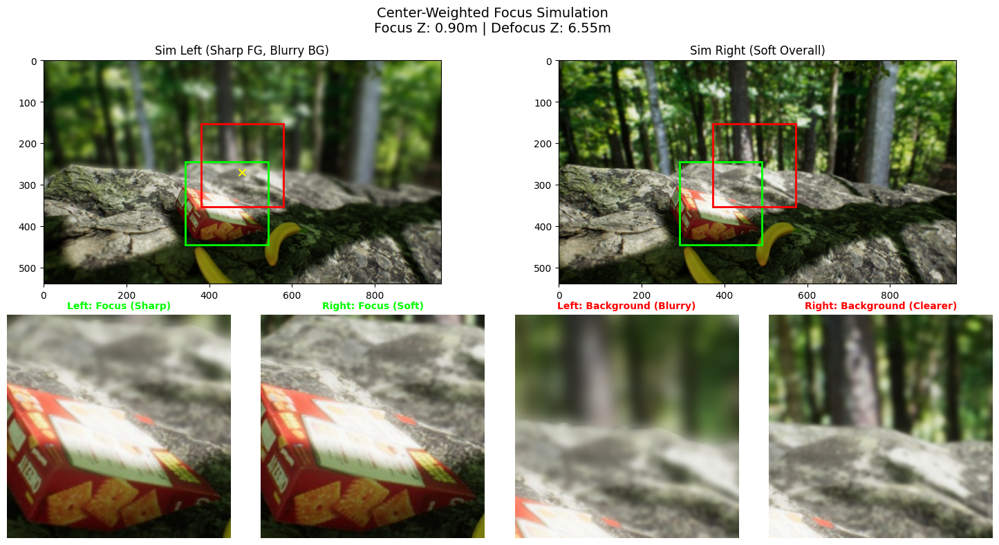

In [ ]:
import os
import glob
import random
import numpy as np # 确保导入numpy
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# ==========================================
# 1. 随机数据加载
# ==========================================
DATA_ROOT = '/content/dataset/fat/mixed/'

all_left_imgs = glob.glob(os.path.join(DATA_ROOT, '*', '*.left.jpg'))

if len(all_left_imgs) == 0:
    print("❌ 未找到图片，请检查 DATA_ROOT 路径")
else:
    target_left_path = random.choice(all_left_imgs)
    base_path = target_left_path.replace('.left.jpg', '')
    target_right_path = base_path + '.right.jpg'
    target_depth_L_path = base_path + '.left.depth.png'
    target_depth_R_path = base_path + '.right.depth.png'

    print(f"🎲 选中样本: {os.path.basename(base_path)}")

    img_L = cv2.cvtColor(cv2.imread(target_left_path), cv2.COLOR_BGR2RGB)
    img_R = cv2.cvtColor(cv2.imread(target_right_path), cv2.COLOR_BGR2RGB)

    # 读取深度
    raw_depth_L = cv2.imread(target_depth_L_path, cv2.IMREAD_UNCHANGED)
    # FAT标准: raw / 10000.0 = meters (假设单位是mm)
    depth_L_m = raw_depth_L.astype(np.float32) / 10000.0

    if os.path.exists(target_depth_R_path):
        raw_depth_R = cv2.imread(target_depth_R_path, cv2.IMREAD_UNCHANGED)
        depth_R_m = raw_depth_R.astype(np.float32) / 10000.0
    else:
        depth_R_m = depth_L_m

    # ==========================================
    # 2. [关键改进] 中心优先的对焦策略
    # ==========================================
    h, w = depth_L_m.shape
    cy, cx = h // 2, w // 2

    # 定义中心区域 (Center ROI): 取中间 50% 的范围
    # 医生通常把关注点放在中间
    y1, y2 = int(h * 0.25), int(h * 0.75)
    x1, x2 = int(w * 0.25), int(w * 0.75)

    depth_roi = depth_L_m[y1:y2, x1:x2]

    # 过滤无效点 (0值)
    valid_roi = depth_roi[depth_roi > 0.1]

    if len(valid_roi) == 0:
        # 如果中间全是无效的，退回到全图
        valid_roi = depth_L_m[depth_L_m > 0.1]

    # 策略 A: 自动对焦 (Focus)
    # 找中心区域里"比较近"的物体，而不是全图最近的边缘噪点
    # 使用 10% 分位数，代表 ROI 里的前景物体
    FOCUS_DIST_M = np.percentile(valid_roi, 10)

    # 策略 B: 自动背景 (Defocus)
    # 找中心区域里的"背景/地板"，而不是全图最远的无穷远
    # 使用 90% 分位数，代表物体背后的平面
    DEFOCUS_DIST_M = np.percentile(valid_roi, 90)

    # 防止两者太接近 (如果全是平面)
    if abs(DEFOCUS_DIST_M - FOCUS_DIST_M) < 0.1:
        DEFOCUS_DIST_M = FOCUS_DIST_M + 0.3 # 强行推后 30cm

    print(f"🎯 优化对焦策略:")
    print(f"   对焦距离 (前景): {FOCUS_DIST_M:.3f} 米")
    print(f"   离焦距离 (背景): {DEFOCUS_DIST_M:.3f} 米")

    # ==========================================
    # 3. 仿真执行
    # ==========================================
    print("🚀 正在渲染左图...")
    sim_L = simulate_layered_dof(img_L, depth_L_m, FOCUS_DIST_M,
                                 aperture_scale=16,    # 可以放心开大了
                                 base_blur_px=0.0,
                                 coc_threshold_px=3) # 增加清晰厚度

    print("🚀 正在渲染右图...")
    sim_R = simulate_layered_dof(img_R, depth_R_m, FOCUS_DIST_M,
                                 aperture_scale=3,
                                 base_blur_px=3,
                                 coc_threshold_px=3) # 右眼清晰范围更大
    # ==========================================
    # 4. 可视化选点 (找离中心最近的匹配点)
    # ==========================================

    def find_best_pixel_for_depth(depth_map, target_depth, tolerance=0.05):
        """
        在深度图中寻找深度接近 target_depth 的点。
        规则: 优先选离图像中心最近的点 (避免选到边缘)。
        """
        # 1. 找所有深度接近的点
        mask = np.abs(depth_map - target_depth) < tolerance
        ys, xs = np.where(mask)

        if len(ys) == 0:
            # 如果没找到，放宽容差再找一次
            mask = np.abs(depth_map - target_depth) < (tolerance * 5)
            ys, xs = np.where(mask)

        if len(ys) == 0: return cy, cx # 实在找不到就返回中心

        # 2. 计算这些点到图像中心的距离
        dist_sq = (ys - cy)**2 + (xs - cx)**2

        # 3. 选距离最小的那个
        best_idx = np.argmin(dist_sq)
        return ys[best_idx], xs[best_idx]

    # 找坐标
    fy, fx = find_best_pixel_for_depth(depth_L_m, FOCUS_DIST_M)
    by, bx = find_best_pixel_for_depth(depth_L_m, DEFOCUS_DIST_M)

    # 计算右图对应坐标
    def get_right_x(lx, z_m):
        # 再次用到 FAT 参数
        FAT_FX = 768.16
        FAT_BASELINE = 0.06
        disp = (FAT_FX * FAT_BASELINE) / (z_m + 1e-6)
        rx = lx - disp
        return int(np.clip(rx, 0, w-1))

    fx_R = get_right_x(fx, FOCUS_DIST_M)
    bx_R = get_right_x(bx, depth_L_m[by, bx]) # 用该点真实深度计算

    # --- 绘图 ---
    def plot_crop(ax, img, x, y, title, color):
        size = 100
        y1, y2 = max(0, y-size), min(h, y+size)
        x1, x2 = max(0, x-size), min(w, x+size)
        crop = img[y1:y2, x1:x2]
        ax.imshow(crop)
        ax.set_title(title, fontsize=10, color=color, fontweight='bold')
        ax.axis('off')
        return patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor=color, facecolor='none')

    fig = plt.figure(figsize=(15, 8))

    # 标题显示对焦信息
    plt.suptitle(f"Center-Weighted Focus Simulation\nFocus Z: {FOCUS_DIST_M:.2f}m | Defocus Z: {DEFOCUS_DIST_M:.2f}m", fontsize=14)

    ax1 = plt.subplot(2, 2, 1); ax1.imshow(sim_L); ax1.set_title("Sim Left (Sharp FG, Blurry BG)")
    ax2 = plt.subplot(2, 2, 2); ax2.imshow(sim_R); ax2.set_title("Sim Right (Soft Overall)")

    # 绘制细节 - 对焦处 (绿色)
    ax3 = plt.subplot(2, 4, 5); rect_L_f = plot_crop(ax3, sim_L, fx, fy, "Left: Focus (Sharp)", 'lime')
    ax4 = plt.subplot(2, 4, 6); rect_R_f = plot_crop(ax4, sim_R, fx_R, fy, "Right: Focus (Soft)", 'lime')

    # 绘制细节 - 离焦处 (红色)
    ax5 = plt.subplot(2, 4, 7); rect_L_b = plot_crop(ax5, sim_L, bx, by, "Left: Background (Blurry)", 'red')
    ax6 = plt.subplot(2, 4, 8); rect_R_b = plot_crop(ax6, sim_R, bx_R, by, "Right: Background (Clearer)", 'red')

    ax1.add_patch(rect_L_f); ax1.add_patch(rect_L_b)
    ax2.add_patch(rect_R_f); ax2.add_patch(rect_R_b)

    # 在图上标记中心点，确认是否跑偏
    ax1.scatter([cx], [cy], c='yellow', marker='x', s=50, label='Image Center')

    plt.tight_layout()
    plt.show()

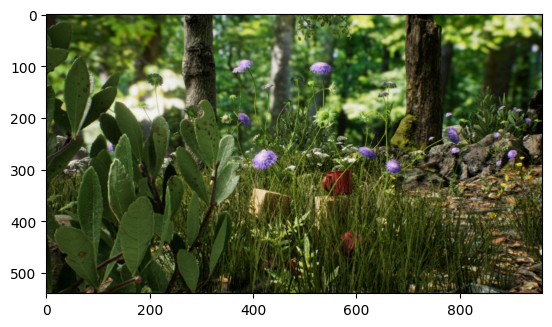

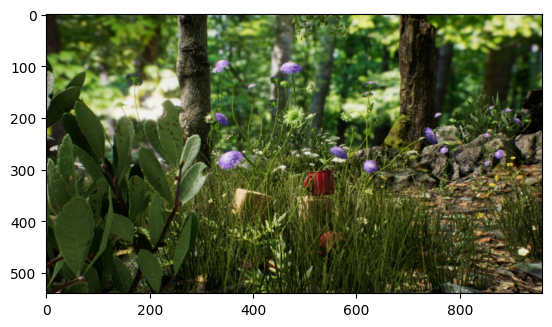

In [ ]:
plt.imshow(img_L)
plt.show()
plt.imshow(img_R)
plt.show()

深度特征测试，用于辅助参数设定，不用运行。只是为了看一看1500张图的深度情况如何，从而决定我的coc_threshold_px设置为多少。

🚀 正在分析 100 张深度图特征...


100%|██████████| 100/100 [00:02<00:00, 37.14it/s]



📊 FAT 数据集深度特征分析报告
1. 深度范围 (Meters):
   - 典型最近点 (Min): 0.805 m
   - 典型最远点 (Max): 3.735 m

2. 场景结构 (双峰聚类):
   - 📦 典型物体深度 (Foreground): 1.258 m
   - 🧱 典型背景深度 (Background): 2.907 m
   - 📏 物理距离差: 1.649 m

3. 光学特征 (用于调参的关键):
   - 典型屈光度差 (Diopter Gap): 0.4072 m⁻¹
     (即 |1/Z_obj - 1/Z_bg| 的平均值)
----------------------------------------
💡 参数设置建议 (基于数据推算):
1. aperture_scale (光圈系数):
   [左眼] 建议设为: 49.1 (目标背景模糊 ~20.0px)
   [右眼] 建议设为: 7.4 (目标背景模糊 ~3.0px)

2. coc_threshold_px (清晰区阈值):
   物体自身厚度假设为 10cm。在左眼大光圈下，
   物体边缘产生的模糊半径约为: 2.88 px
   👉 建议设为: 2.9 px (以覆盖物体厚度)


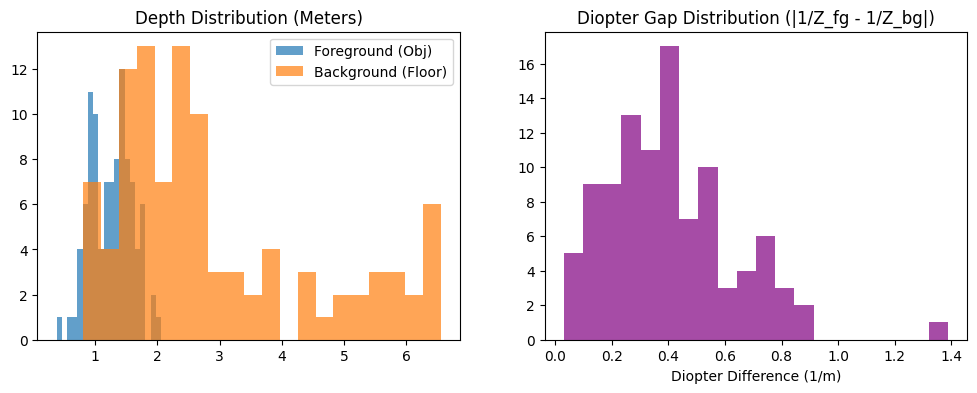

In [ ]:
import os
import glob
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from tqdm import tqdm

# ================= 配置 =================
DATA_ROOT = '/content/dataset/fat/mixed'  # 你的数据路径
SAMPLE_COUNT = 100  # 抽样分析多少张图 (建议50-100)
FAT_UNIT_SCALE = 10000.0  # 0.1mm -> meters

# ================= 核心分析函数 =================
def analyze_depth_distribution():
    # 1. 搜集文件
    all_depth_files = glob.glob(os.path.join(DATA_ROOT, '*', '*.left.depth.png'))
    if len(all_depth_files) == 0:
        print("❌ 未找到深度图，请检查路径。")
        return

    # 随机抽样
    sampled_files = random.sample(all_depth_files, min(len(all_depth_files), SAMPLE_COUNT))

    # 统计容器
    stats = {
        'min_depth': [],
        'max_depth': [],
        'fg_center': [], # 前景聚类中心
        'bg_center': [], # 背景聚类中心
        'diopter_gap': [] # 屈光度差 (最重要的指标)
    }

    print(f"🚀 正在分析 {len(sampled_files)} 张深度图特征...")

    for p in tqdm(sampled_files):
        # 读取并转单位
        raw = cv2.imread(p, cv2.IMREAD_UNCHANGED)
        if raw is None: continue

        depth_m = raw.astype(np.float32) / FAT_UNIT_SCALE

        # 过滤无效值
        valid = depth_m[depth_m > 0.1]
        if len(valid) < 100: continue

        # --- A. 基础统计 ---
        stats['min_depth'].append(np.min(valid))
        stats['max_depth'].append(np.max(valid))

        # --- B. 智能双峰分析 (K-Means Clustering) ---
        # 我们假设场景由 "前景物体" 和 "背景地板" 两部分组成
        # 用 K-Means 找两个中心
        kmeans = KMeans(n_clusters=2, n_init=10, random_state=0)
        # 为了速度，只采样 2000 个点做聚类
        sample_pixels = np.random.choice(valid, min(len(valid), 2000)).reshape(-1, 1)
        kmeans.fit(sample_pixels)

        centers = sorted(kmeans.cluster_centers_.flatten())
        fg_c, bg_c = centers[0], centers[1] # 小的是前景，大的是背景

        stats['fg_center'].append(fg_c)
        stats['bg_center'].append(bg_c)

        # --- C. 计算屈光度差 (Optical Distance) ---
        # 假设对焦在前景，背景有多糊？取决于这个差值
        # Gap = |1/Z_fg - 1/Z_bg|
        d_gap = abs(1.0/fg_c - 1.0/bg_c)
        stats['diopter_gap'].append(d_gap)

    # ================= 汇总报告 =================
    avg_fg = np.mean(stats['fg_center'])
    avg_bg = np.mean(stats['bg_center'])
    avg_gap = np.mean(stats['diopter_gap'])
    max_gap = np.max(stats['diopter_gap'])

    print("\n" + "="*40)
    print("📊 FAT 数据集深度特征分析报告")
    print("="*40)
    print(f"1. 深度范围 (Meters):")
    print(f"   - 典型最近点 (Min): {np.mean(stats['min_depth']):.3f} m")
    print(f"   - 典型最远点 (Max): {np.mean(stats['max_depth']):.3f} m")

    print(f"\n2. 场景结构 (双峰聚类):")
    print(f"   - 📦 典型物体深度 (Foreground): {avg_fg:.3f} m")
    print(f"   - 🧱 典型背景深度 (Background): {avg_bg:.3f} m")
    print(f"   - 📏 物理距离差: {(avg_bg - avg_fg):.3f} m")

    print(f"\n3. 光学特征 (用于调参的关键):")
    print(f"   - 典型屈光度差 (Diopter Gap): {avg_gap:.4f} m⁻¹")
    print(f"     (即 |1/Z_obj - 1/Z_bg| 的平均值)")

    print("-" * 40)
    print("💡 参数设置建议 (基于数据推算):")

    # --- 自动推算 Aperture Scale ---
    # 目标: 我们希望背景的模糊半径大约是 Target_Blur 像素
    # 公式: Blur = Scale * Gap
    # 所以: Scale = Blur / Gap

    target_blur_heavy = 20.0 # 左眼: 希望背景糊成 20px
    target_blur_light = 3.0  # 右眼: 希望背景糊成 3px

    rec_scale_L = target_blur_heavy / avg_gap
    rec_scale_R = target_blur_light / avg_gap

    print(f"1. aperture_scale (光圈系数):")
    print(f"   [左眼] 建议设为: {rec_scale_L:.1f} (目标背景模糊 ~{target_blur_heavy}px)")
    print(f"   [右眼] 建议设为: {rec_scale_R:.1f} (目标背景模糊 ~{target_blur_light}px)")

    # --- 自动推算 CoC Threshold ---
    # 目标: 我们希望物体本身是清晰的
    # 假设物体自身的厚度约为 10cm (0.1m)
    # 计算物体前表面到后表面的屈光度差
    obj_thickness_gap = abs(1.0/avg_fg - 1.0/(avg_fg + 0.1))
    # 对应的模糊半径
    blur_on_obj = rec_scale_L * obj_thickness_gap

    print(f"\n2. coc_threshold_px (清晰区阈值):")
    print(f"   物体自身厚度假设为 10cm。在左眼大光圈下，")
    print(f"   物体边缘产生的模糊半径约为: {blur_on_obj:.2f} px")
    print(f"   👉 建议设为: {min(blur_on_obj, 3.0):.1f} px (以覆盖物体厚度)")

    # ================= 可视化分布 =================
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.hist(stats['fg_center'], bins=20, alpha=0.7, label='Foreground (Obj)')
    plt.hist(stats['bg_center'], bins=20, alpha=0.7, label='Background (Floor)')
    plt.title("Depth Distribution (Meters)")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.hist(stats['diopter_gap'], bins=20, color='purple', alpha=0.7)
    plt.title("Diopter Gap Distribution (|1/Z_fg - 1/Z_bg|)")
    plt.xlabel("Diopter Difference (1/m)")

    plt.show()

if __name__ == "__main__":
    analyze_depth_distribution()

RAFT-Stereo下载

In [3]:
# 1. 克隆代码库
!git clone https://github.com/princeton-vl/RAFT-Stereo.git

# 2. 安装依赖 (通常 Colab 缺少的库)
!pip install tensorboard

# 4. 把代码库加入 Python 路径，这样我们可以直接 import RAFT
import sys
sys.path.append('RAFT-Stereo')

Cloning into 'RAFT-Stereo'...
remote: Enumerating objects: 87, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 87 (delta 40), reused 33 (delta 33), pack-reused 29 (from 1)
Receiving objects: 100% (87/87), 703.12 KiB | 54.09 MiB/s, done.
Resolving deltas: 100% (41/41), done.


In [4]:
# 1. 进入代码目录
%cd RAFT-Stereo

# 2. 运行官方下载脚本
# 这会下载 sceneflow 和 middlebury 的预训练模型
!bash download_models.sh

# 3. 回到主目录
%cd ..

# 4. 把下载好的模型复制到我们之前创建的 models 文件夹
# 官方脚本解压后，模型通常位于 RAFT-Stereo/models/ 目录下，但需要更名为训练脚本所需的格式
!mkdir -p models
# 修正：从 RAFT-Stereo/models/raftstereo-sceneflow.pth 复制到 models/raft_stereo_sceneflow.pth
!cp RAFT-Stereo/models/raftstereo-sceneflow.pth models/raft_stereo_sceneflow.pth

# 5. 验证是否成功
import os
if os.path.exists('models/raft_stereo_sceneflow.pth'):
    print("✅ 模型下载并移动成功！")
else:
    print("❌ 下载失败，请尝试方案 2")

/content/RAFT-Stereo
--2026-01-27 07:03:16--  https://www.dropbox.com/s/ftveifyqcomiwaq/models.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.81.18, 2620:100:6031:18::a27d:5112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.81.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/z720aslw752iypqqdre7c/models.zip?rlkey=3criskutu26wwrx4h9g42aqx0 [following]
--2026-01-27 07:03:16--  https://www.dropbox.com/scl/fi/z720aslw752iypqqdre7c/models.zip?rlkey=3criskutu26wwrx4h9g42aqx0
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uca7a79dd43b3ee8d9003de36973.dl.dropboxusercontent.com/cd/0/inline/C5wt8g5SXxLzmlmPGCGB36fYubE01fiHq5RaeR8G3VqKEPUivlqJ7JrJA-j1SpazPXiGcv-2-mhpMd_fp_2agfw2tdEzGNjTEr4kCeNsptwUAdirHNq7jIaQpvH56m1cGF8LFNwnjfHL2e8JXgS3sGps/file# [following]
--2026-01-27 07:03:17--  https://uca7a79dd43b3ee8d9003de36973.dl.dropboxusercontent

最终训练代码v4，测试集与训练集分开、

In [ ]:
training_script = r"""
# ==========================================
# 生成最终训练脚本: train_edof_final_v2.py
# (含 Drive保存 + 数据集切分 + 进度条 + Loss曲线)
# ==========================================
import sys
sys.path.append('RAFT-Stereo')
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
from torch.cuda.amp import GradScaler
import numpy as np
import os
import cv2
import glob
import matplotlib.pyplot as plt
from tqdm import tqdm  # 引入进度条
from torch.utils.data import Dataset
from core.raft_stereo import RAFTStereo
from core.utils.utils import InputPadder

# ================= 配置区 (请修改这里) =================
# 1. 确保挂载 Drive
from google.colab import drive
if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

# 2. 模型保存路径 (直接存到网盘!)
SAVE_DIR = '/content/drive/MyDrive/Endo-projects/EDOF-DualCamera/StereoMatching_FAT/RAFT_EDOF_Models'
os.makedirs(SAVE_DIR, exist_ok=True)

BATCH_SIZE = 12
NUM_STEPS = 5000
LOG_INTERVAL = 50
SAVE_INTERVAL = 1000 # 每2000步存一次
LR = 0.0004
DEVICE = 'cuda'
PRETRAINED_CKPT = 'models/raft_stereo_sceneflow.pth'

# 仿真参数
SCALE_LEFT = 16.0
SCALE_RIGHT = 3.0
CROP_SIZE = (512, 896)

# ================= 仿真函数 (使用高级分层版) =================
def simulate_layered_dof(img, depth_map_meters, focus_dist_meters, aperture_scale, base_blur_px=0.0, coc_threshold_px=1.5):
    # 1. 预处理
    depth_safe = np.maximum(depth_map_meters, 0.1)
    diopter_map = 1.0 / depth_safe
    diopter_focus = 1.0 / max(focus_dist_meters, 0.1)

    # 2. 计算物理模糊半径
    raw_blur_radius = aperture_scale * np.abs(diopter_map - diopter_focus)

    # 核心修正 A: 引入“清晰区”
    blur_radius_map = np.where(raw_blur_radius < coc_threshold_px, 0, raw_blur_radius)
    blur_radius_map += base_blur_px

    # 核心修正 B: 模糊半径截断
    MAX_RENDER_BLUR = 30.0
    blur_radius_map = np.clip(blur_radius_map, 0, MAX_RENDER_BLUR)

    # 3. 准备分层渲染
    img_float = img.astype(np.float32) / 255.0
    output = np.zeros_like(img_float)
    total_weight = np.zeros(img_float.shape[:2] + (1,), dtype=np.float32)

    num_layers = 30
    radii_levels = np.linspace(0, MAX_RENDER_BLUR, num_layers)
    layer_step = MAX_RENDER_BLUR / num_layers
    sigma = layer_step * 1.0

    # 4. 逐层叠加
    for r in radii_levels:
        diff = blur_radius_map - r
        weights = np.exp(-0.5 * (diff ** 2) / (sigma ** 2))
        weights = np.expand_dims(weights, axis=-1)

        if np.max(weights) < 0.001: continue

        ksize = int(r * 2 + 1) | 1
        if ksize <= 1:
            blurred = img_float
        else:
            blurred = cv2.GaussianBlur(img_float, (ksize, ksize), 0)

        output += blurred * weights
        total_weight += weights

    total_weight = np.maximum(total_weight, 1e-6)
    output /= total_weight

    # 强制恢复锐度
    sharp_mask = raw_blur_radius < 0.5
    if len(img_float.shape) == 3 and len(sharp_mask.shape) == 2:
        sharp_mask = np.expand_dims(sharp_mask, axis=-1)
    output = np.where(sharp_mask, img_float, output)

    return np.clip(output * 255, 0, 255).astype(np.uint8)


# ================= Dataset =================
class FATFinalDataset(Dataset):
    def __init__(self, file_list, crop_size=(512, 896)):
        self.left_files = file_list
        self.crop_h, self.crop_w = crop_size
        self.scale_L = SCALE_LEFT
        self.scale_R = SCALE_RIGHT

    def __len__(self): return len(self.left_files)

    def __getitem__(self, idx):
        l_path = self.left_files[idx]
        base_path = l_path.replace('.left.jpg', '')

        img_L = cv2.imread(l_path)
        img_R = cv2.imread(base_path + '.right.jpg')
        img_L = cv2.cvtColor(img_L, cv2.COLOR_BGR2RGB)
        img_R = cv2.cvtColor(img_R, cv2.COLOR_BGR2RGB)
        depth_L = cv2.imread(base_path + '.left.depth.png', -1).astype(np.float32) / 10000.0
        depth_R = depth_L

        # Random Crop
        H, W, _ = img_L.shape
        if H > self.crop_h and W > self.crop_w:
            y = np.random.randint(0, H - self.crop_h)
            x = np.random.randint(0, W - self.crop_w)
            img_L = img_L[y:y+self.crop_h, x:x+self.crop_w]
            img_R = img_R[y:y+self.crop_h, x:x+self.crop_w]
            depth_L = depth_L[y:y+self.crop_h, x:x+self.crop_w]
            depth_R = depth_R[y:y+self.crop_h, x:x+self.crop_w]

        # 随机对焦
        valid_depth = depth_L[depth_L > 0.1]
        if len(valid_depth) > 0:
            min_d, max_d = np.percentile(valid_depth, 5), np.percentile(valid_depth, 95)
            focus_dist = np.random.uniform(min_d, max_d)
        else:
            focus_dist = 1.0

        sim_L = simulate_layered_dof(img_L, depth_L, focus_dist, self.scale_L, 0.0, 3.0)
        sim_R = simulate_layered_dof(img_R, depth_R, focus_dist, self.scale_R, 3, 3.0)

        f, B = 768.16, 0.06
        disp_gt_raw = (f * B) / (depth_L + 1e-6)
        disp_focus_val = (f * B) / focus_dist
        shift_int = int(round(disp_focus_val))

        disp_gt_final = disp_gt_raw - shift_int

        sim_R_shifted = np.zeros_like(sim_R)
        if shift_int > 0:
            if shift_int < self.crop_w:
                sim_R_shifted[:, shift_int:] = sim_R[:, :-shift_int]
        elif shift_int < 0:
            if -shift_int < self.crop_w:
                sim_R_shifted[:, :shift_int] = sim_R[:, -shift_int:]
        else:
            sim_R_shifted = sim_R

        img_L = torch.from_numpy(sim_L).permute(2, 0, 1).float()
        img_R = torch.from_numpy(sim_R_shifted).permute(2, 0, 1).float()
        disp = torch.from_numpy(disp_gt_final).unsqueeze(0).float()

        valid = (disp > -200) & (disp < 200)
        if shift_int > 0: valid[:, :, :shift_int] = False

        return {'left': img_L, 'right': img_R, 'disparity': disp, 'mask': valid}

# ================= Loss =================
def sequence_loss_bias0(flow_preds, flow_gt, valid, gamma=0.8):
    n_preds = len(flow_preds)
    flow_loss = 0.0
    in_focus = (flow_gt.abs() < 3.0).float()
    weights = 1.0 + in_focus * 2.0

    for i in range(n_preds):
        i_weight = gamma ** (n_preds - i - 1)
        i_loss = (flow_preds[i] - flow_gt).abs()
        i_loss = i_loss * weights
        flow_loss += i_weight * (valid[:, None] * i_loss).mean()
    return flow_loss

# ================= Main =================
def train():
    class Args:
        restore_ckpt = PRETRAINED_CKPT
        shared_backbone = False
        n_gru_layers = 3
        n_downsample = 2
        slow_fast_gru = False
        valid_iters = 32
        hidden_dims = [128]*3
        corr_implementation = "reg"
        mixed_precision = True
        corr_levels = 4
        corr_radius = 4
        context_norm = 'batch'

    args = Args()
    model = RAFTStereo(args).to(DEVICE)
    if os.path.exists(args.restore_ckpt):
        print(f"Loading {args.restore_ckpt}")
        state = torch.load(args.restore_ckpt)
        new_state = {k.replace('module.', ''): v for k, v in state.items()}
        model.load_state_dict(new_state, strict=False)

    model.train()

    all_files = sorted(glob.glob(os.path.join('/content/dataset/fat/mixed', '*', '*.left.jpg')))
    split_idx = int(len(all_files) * 0.9)
    train_files = all_files[:split_idx]
    val_files = all_files[split_idx:]

    print(f"Total images: {len(all_files)}")
    print(f"Train samples: {len(train_files)}, Val samples: {len(val_files)}")

    train_dataset = FATFinalDataset(train_files, crop_size=CROP_SIZE)
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8, pin_memory=True)

    optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-5)
    scaler = GradScaler()
    scheduler = optim.lr_scheduler.OneCycleLR(optimizer, LR, NUM_STEPS+100, pct_start=0.05, cycle_momentum=False, anneal_strategy='linear')

    print(f"🚀 Start Training! Saving to: {SAVE_DIR}")

    # === 初始化 Log 列表 ===
    loss_history = []
    epe_history = []

    # === 进度条 ===
    pbar = tqdm(total=NUM_STEPS, desc="Training", unit="step")

    total_steps = 0
    while total_steps < NUM_STEPS:
        for batch in train_loader:
            optimizer.zero_grad()

            imgL = batch['left'].to(DEVICE)
            imgR = batch['right'].to(DEVICE)
            gt = batch['disparity'].to(DEVICE)
            mask = batch['mask'].to(DEVICE)

            with torch.cuda.amp.autocast():
                preds = model(imgL, imgR, iters=12)
                loss = sequence_loss_bias0(preds, gt, mask)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            scaler.step(optimizer)
            scheduler.step()
            scaler.update()

            total_steps += 1

            # === 记录 Loss ===
            current_loss = loss.item()
            loss_history.append(current_loss)

            # 更新进度条信息
            pbar.set_postfix({'loss': f"{current_loss:.4f}"})
            pbar.update(1)

            if total_steps % LOG_INTERVAL == 0:
                epe = (preds[-1] - gt).abs()[mask].mean().item()
                epe_history.append(epe)
                # tqdm.write 可以在不打断进度条的情况下打印
                tqdm.write(f"Step {total_steps} | Loss: {current_loss:.4f} | EPE: {epe:.4f}")

            # 保存到 Drive
            if total_steps % SAVE_INTERVAL == 0:
                save_path = os.path.join(SAVE_DIR, f'raft_edof_{total_steps}.pth')
                torch.save(model.state_dict(), save_path)
                tqdm.write(f"✅ Model saved to {save_path}")

                # === 绘制并保存曲线 ===
                # 1. Loss Curve
                plt.figure(figsize=(10, 5))
                plt.plot(loss_history, label='Training Loss', color='blue', alpha=0.6)
                plt.xlabel('Steps')
                plt.ylabel('Loss')
                plt.title('Training Loss Curve')
                plt.legend()
                plt.grid(True)
                plt.savefig(os.path.join(SAVE_DIR, 'loss_curve.png'))
                plt.close()

                # 2. EPE Curve
                if len(epe_history) > 0:
                    plt.figure(figsize=(10, 5))
                    # EPE 是每 LOG_INTERVAL 记一次，横坐标要调整
                    steps_x = np.arange(1, len(epe_history) + 1) * LOG_INTERVAL
                    plt.plot(steps_x, epe_history, label='EPE', color='red', marker='.')
                    plt.xlabel('Steps')
                    plt.ylabel('EPE (px)')
                    plt.title('End Point Error (EPE) Curve')
                    plt.legend()
                    plt.grid(True)
                    plt.savefig(os.path.join(SAVE_DIR, 'epe_curve.png'))
                    plt.close()

            if total_steps >= NUM_STEPS:
                break

    pbar.close()

if __name__ == '__main__':
    train()
"""

with open('train_edof_final_v2.py', 'w') as f:
    f.write(training_script)

print("✅ train_edof_final_v2.py 已更新！(含进度条和Loss绘图)")
print("请运行: !python train_edof_final_v2.py")

✅ train_edof_final_v2.py 已更新！(含进度条和Loss绘图)
请运行: !python train_edof_final_v2.py


In [ ]:
!python train_edof_final_v2.py

Loading models/raft_stereo_sceneflow.pth
Total images: 1500
Train samples: 1350, Val samples: 150
/content/train_edof_final_v2.py:223: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
🚀 Start Training! Saving to: /content/drive/MyDrive/Endo-projects/EDOF-DualCamera/StereoMatching_FAT/RAFT_EDOF_Models
Training:   0% 0/5000 [00:00<?, ?step/s]/content/train_edof_final_v2.py:245: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/content/RAFT-Stereo/core/raft_stereo.py:77: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=self.args.mixed_precision):
/usr/local/lib/python3.12/dist-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to p

验证训练效果。

🔥 加载模型: /content/drive/MyDrive/Endo-projects/EDOF-DualCamera/StereoMatching_FAT/RAFT_EDOF_Models/raft_edof_5000.pth
🧐 测试集包含 150 张图片

🚀 开始评估...


/content/RAFT-Stereo/core/raft_stereo.py:77: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=self.args.mixed_precision):
/usr/local/lib/python3.12/dist-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4317.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/content/RAFT-Stereo/core/raft_stereo.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=self.args.mixed_precision):


Image 1: EPE=0.198 px, D1(>3px)=0.17%


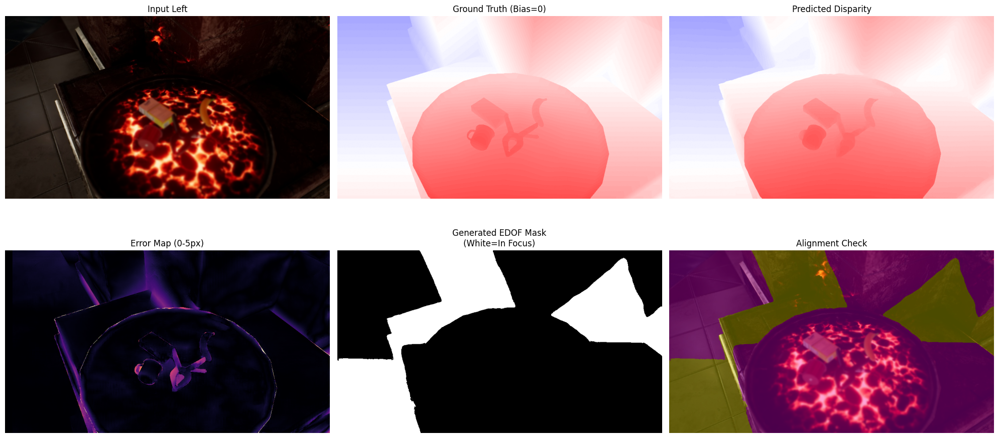

Image 2: EPE=0.309 px, D1(>3px)=0.32%
Image 3: EPE=1.871 px, D1(>3px)=15.91%
Image 4: EPE=0.467 px, D1(>3px)=1.69%
Image 5: EPE=0.142 px, D1(>3px)=0.20%

📊 平均结果 (测试了 5 张):
   Avg EPE: 0.5973 px
   Avg D1 (>3px): 3.66%


In [ ]:
import sys
sys.path.append('RAFT-Stereo')
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import numpy as np
import cv2
import os
import glob
import matplotlib.pyplot as plt
from core.raft_stereo import RAFTStereo
from core.utils.utils import InputPadder

# ================= 配置区 =================
DEVICE = 'cuda'
# 【重要】请修改为你 Drive 里保存的最新模型路径
CHECKPOINT_PATH = '/content/drive/MyDrive/Endo-projects/EDOF-DualCamera/StereoMatching_FAT/RAFT_EDOF_Models/raft_edof_5000.pth'
DATA_ROOT = '/content/dataset/fat/mixed' # 数据集路径

# 仿真参数 (必须与训练一致)
SCALE_LEFT = 16.0
SCALE_RIGHT = 3.0

# ================= 1. 定义仿真与Dataset =================
# (这里必须重新定义一遍，确保测试时逻辑与训练完全一致)
def simulate_layered_dof(img, depth_map_meters, focus_dist_meters, aperture_scale, base_blur_px=0.0, coc_threshold_px=1.5):
    # 1. 预处理
    depth_safe = np.maximum(depth_map_meters, 0.1)
    diopter_map = 1.0 / depth_safe
    diopter_focus = 1.0 / max(focus_dist_meters, 0.1)

    # 2. 计算物理模糊半径
    raw_blur_radius = aperture_scale * np.abs(diopter_map - diopter_focus)

    # 核心修正 A: 引入“清晰区”
    blur_radius_map = np.where(raw_blur_radius < coc_threshold_px, 0, raw_blur_radius)
    blur_radius_map += base_blur_px

    # 核心修正 B: 模糊半径截断
    MAX_RENDER_BLUR = 30.0
    blur_radius_map = np.clip(blur_radius_map, 0, MAX_RENDER_BLUR)

    # 3. 准备分层渲染
    img_float = img.astype(np.float32) / 255.0
    output = np.zeros_like(img_float)
    total_weight = np.zeros(img_float.shape[:2] + (1,), dtype=np.float32)

    num_layers = 30
    radii_levels = np.linspace(0, MAX_RENDER_BLUR, num_layers)
    layer_step = MAX_RENDER_BLUR / num_layers
    sigma = layer_step * 1.0

    # 4. 逐层叠加
    for r in radii_levels:
        diff = blur_radius_map - r
        weights = np.exp(-0.5 * (diff ** 2) / (sigma ** 2))
        weights = np.expand_dims(weights, axis=-1)

        if np.max(weights) < 0.001: continue

        ksize = int(r * 2 + 1) | 1
        if ksize <= 1:
            blurred = img_float
        else:
            blurred = cv2.GaussianBlur(img_float, (ksize, ksize), 0)

        output += blurred * weights
        total_weight += weights

    total_weight = np.maximum(total_weight, 1e-6)
    output /= total_weight

    # 强制恢复锐度
    sharp_mask = raw_blur_radius < 0.5
    if len(img_float.shape) == 3 and len(sharp_mask.shape) == 2:
        sharp_mask = np.expand_dims(sharp_mask, axis=-1)
    output = np.where(sharp_mask, img_float, output)

    return np.clip(output * 255, 0, 255).astype(np.uint8)

class FATTestDataset(Dataset):
    def __init__(self, root_dir):
        # 拿最后 10% 的数据作为测试集 (简单模拟)
        all_files = sorted(glob.glob(os.path.join(root_dir, '*', '*.left.jpg')))
        split_idx = int(len(all_files) * 0.9)
        self.left_files = all_files[split_idx:]
        print(f"🧐 测试集包含 {len(self.left_files)} 张图片")

    def __len__(self): return len(self.left_files)

    def __getitem__(self, idx):
        l_path = self.left_files[idx]
        base_path = l_path.replace('.left.jpg', '')

        img_L = cv2.imread(l_path)
        img_R = cv2.imread(base_path + '.right.jpg')
        img_L = cv2.cvtColor(img_L, cv2.COLOR_BGR2RGB)
        img_R = cv2.cvtColor(img_R, cv2.COLOR_BGR2RGB)
        depth_L = cv2.imread(base_path + '.left.depth.png', -1).astype(np.float32) / 10000.0
        depth_R = depth_L

        # 【重点】测试时不裁切！保留 540x960 全分辨率
        # 但是我们会随机生成一个对焦距离，以便和 GT 对比
        valid_depth = depth_L[depth_L > 0.1]
        if len(valid_depth) > 0:
            min_d, max_d = np.percentile(valid_depth, 5), np.percentile(valid_depth, 95)
            # 为了测试稳定性，我们可以固定测试几个距离，或者依然随机
            # 这里保持随机以覆盖各种情况
            focus_dist = np.random.uniform(min_d, max_d)
        else:
            focus_dist = 1.0

        sim_L = simulate_layered_dof(img_L, depth_L, focus_dist, SCALE_LEFT, 0.0, 3.0)
        sim_R = simulate_layered_dof(img_R, depth_R, focus_dist, SCALE_RIGHT, 3, 3.0)

        # 生成真值 GT (Bias=0)
        f, B = 768.16, 0.06
        disp_gt_raw = (f * B) / (depth_L + 1e-6)
        disp_focus_val = (f * B) / focus_dist
        shift_int = int(round(disp_focus_val))
        disp_gt_final = disp_gt_raw - shift_int

        # 简单的 Shift 模拟 (不需要极其精确的 occlusion 处理，主要看视差值)
        sim_R_shifted = np.zeros_like(sim_R)
        H, W, _ = sim_R.shape
        if shift_int > 0:
            if shift_int < W: sim_R_shifted[:, shift_int:] = sim_R[:, :-shift_int]
        elif shift_int < 0:
            if -shift_int < W: sim_R_shifted[:, :shift_int] = sim_R[:, -shift_int:]
        else:
            sim_R_shifted = sim_R

        img_L = torch.from_numpy(sim_L).permute(2, 0, 1).float()
        img_R = torch.from_numpy(sim_R_shifted).permute(2, 0, 1).float()
        disp = torch.from_numpy(disp_gt_final).unsqueeze(0).float()

        # Mask: 视差合理区域 + 去除平移黑边
        valid = (disp > -200) & (disp < 200)
        if shift_int > 0: valid[:, :, :shift_int] = False

        return {'left': img_L, 'right': img_R, 'disparity': disp, 'mask': valid}

# ================= 2. 加载模型 =================
class Args:
    restore_ckpt = None
    shared_backbone = False
    n_gru_layers = 3
    n_downsample = 2
    slow_fast_gru = False
    valid_iters = 32
    hidden_dims = [128]*3
    corr_implementation = "reg"
    mixed_precision = True
    corr_levels = 4
    corr_radius = 4
    context_norm = 'batch'

model = RAFTStereo(Args())
model.to(DEVICE)

if os.path.exists(CHECKPOINT_PATH):
    print(f"🔥 加载模型: {CHECKPOINT_PATH}")
    state_dict = torch.load(CHECKPOINT_PATH)
    new_state = {k.replace('module.', ''): v for k, v in state_dict.items()}
    model.load_state_dict(new_state, strict=False)
else:
    raise FileNotFoundError(f"找不到模型文件: {CHECKPOINT_PATH}")

model.eval()

# ================= 3. 执行测试 =================
def evaluate_model(limit_batches=10):
    dataset = FATTestDataset(DATA_ROOT)
    loader = DataLoader(dataset, batch_size=1, shuffle=True)

    total_epe = 0.0
    total_d1 = 0.0 # 误差 > 3px 的比例
    count = 0

    print("\n🚀 开始评估...")

    for i, batch in enumerate(loader):
        if i >= limit_batches: break # 只测 10 张图，想测全部就把这行注释掉

        imgL = batch['left'].to(DEVICE)
        imgR = batch['right'].to(DEVICE)
        gt = batch['disparity'].to(DEVICE)
        mask = batch['mask'].to(DEVICE)

        # 处理 padding (因为 540 不能被 8 整除)
        padder = InputPadder(imgL.shape)
        imgL_pad, imgR_pad = padder.pad(imgL, imgR)

        with torch.no_grad():
            _, flow_up = model(imgL_pad, imgR_pad, iters=32, test_mode=True)
            pred = padder.unpad(flow_up)

        # 计算指标
        # 取 flow 的第一通道并取负 (RAFT 输出通常是负视差)
        # 但我们 Dataset 里 Bias=0 后 GT 有正有负，模型会自动学
        # 这里直接对比数值即可，RAFT-Stereo 输出的 flow[0] 就是视差
        # 只要维度对齐: pred shape [1, 1, H, W]

        diff = (pred - gt).abs()

        # 只计算有效区域
        if mask.sum() > 0:
            epe = diff[mask].mean().item()
            # D1 Error: 误差 > 3px 且 > 5% 真实值的像素比例 (Stereo 标准)
            # 这里简化为 > 3px
            bad_pixels = (diff > 3.0) & mask
            d1 = bad_pixels.sum() / mask.sum()

            total_epe += epe
            total_d1 += d1.item()
            count += 1

            print(f"Image {i+1}: EPE={epe:.3f} px, D1(>3px)={d1.item()*100:.2f}%")

            # === 可视化第一张图 ===
            if i == 0:
                visualize_result(imgL, pred, gt, mask, diff)

    print("\n" + "="*30)
    print(f"📊 平均结果 (测试了 {count} 张):")
    print(f"   Avg EPE: {total_epe/count:.4f} px")
    print(f"   Avg D1 (>3px): {(total_d1/count)*100:.2f}%")
    print("="*30)

def visualize_result(img, pred, gt, mask, diff):
    img_np = img[0].permute(1, 2, 0).cpu().numpy() / 255.0
    pred_np = pred[0, 0].cpu().numpy()
    gt_np = gt[0, 0].cpu().numpy()
    diff_np = diff[0, 0].cpu().numpy()
    mask_np = mask[0, 0].cpu().numpy()

    # 模拟生成的 Mask (清晰区)
    edof_mask = np.abs(pred_np) < 3.0

    plt.figure(figsize=(20, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(img_np)
    plt.title("Input Left")
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(gt_np, cmap='seismic', vmin=-60, vmax=60)
    plt.title("Ground Truth (Bias=0)")
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(pred_np, cmap='seismic', vmin=-60, vmax=60)
    plt.title("Predicted Disparity")
    plt.axis('off')

    plt.subplot(2, 3, 4)
    # 误差图: 越黑越好，亮色代表误差
    plt.imshow(diff_np * mask_np, cmap='magma', vmin=0, vmax=5)
    plt.title("Error Map (0-5px)")
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(edof_mask, cmap='gray')
    plt.title("Generated EDOF Mask\n(White=In Focus)")
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.imshow(img_np)
    plt.imshow(edof_mask, cmap='spring', alpha=0.3)
    plt.title("Alignment Check")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# 运行评估
evaluate_model(limit_batches=5) # 先测 5 张看看

🚀 正在生成 3 组测试结果...


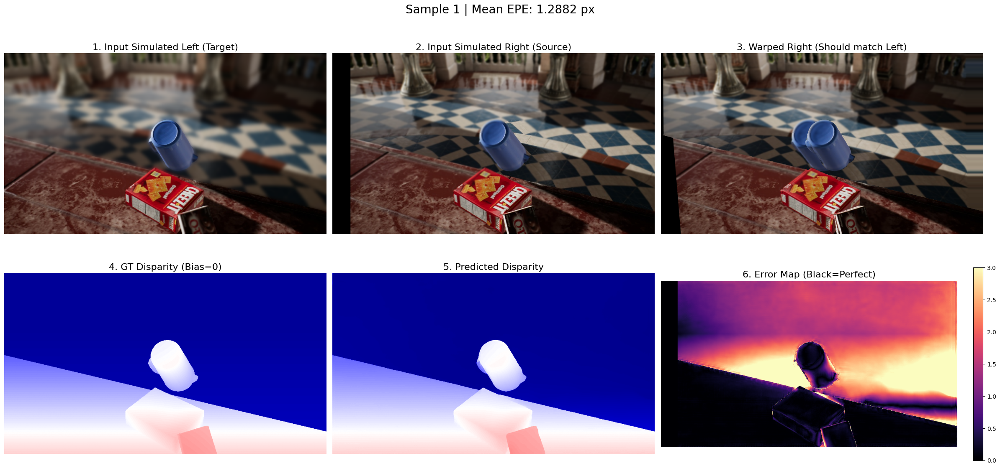

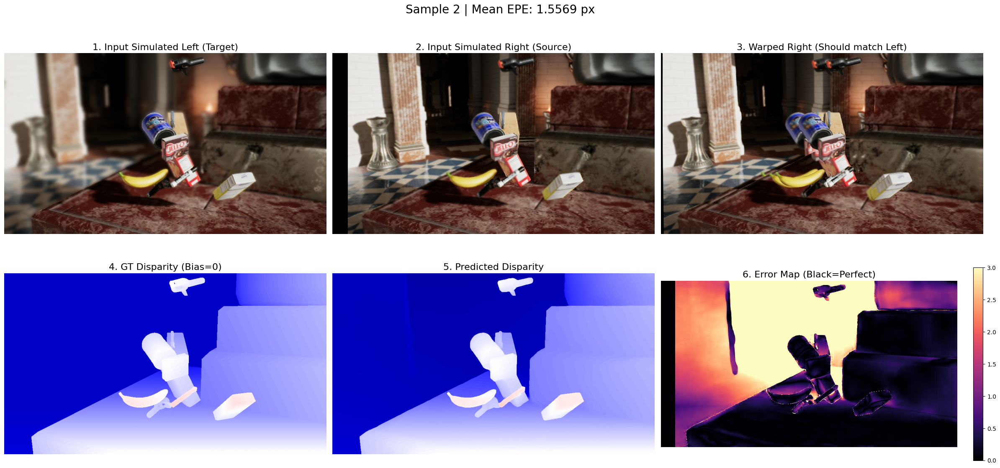

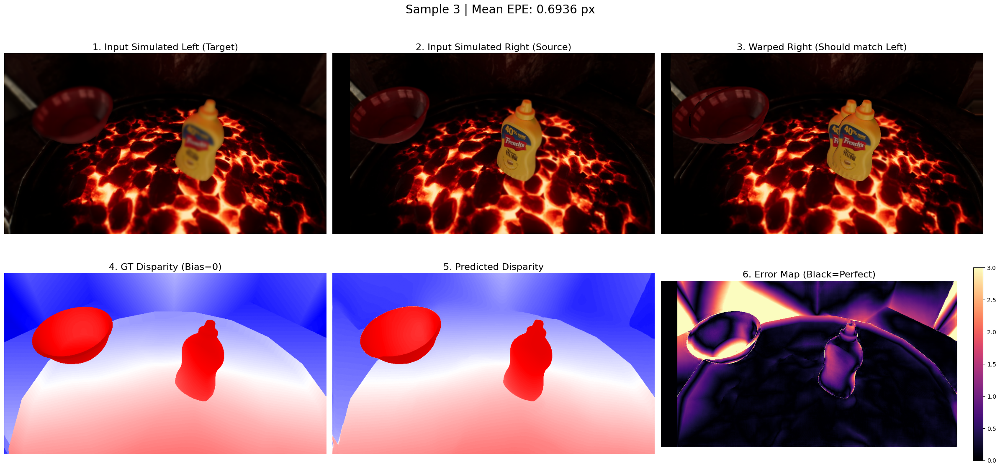

In [ ]:
import sys
sys.path.append('RAFT-Stereo')
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import numpy as np
import cv2
import os
import glob
import matplotlib.pyplot as plt
from core.raft_stereo import RAFTStereo
from core.utils.utils import InputPadder

# ================= 配置区 =================
DEVICE = 'cuda'
# 请确认这是你 Drive 里的最新模型路径
CHECKPOINT_PATH = '/content/drive/MyDrive/Endo-projects/EDOF-DualCamera/StereoMatching_FAT/RAFT_EDOF_Models/raft_edof_20000.pth'
DATA_ROOT = '/content/dataset/fat/mixed'

# 仿真参数
SCALE_LEFT = 16.0
SCALE_RIGHT = 3.0

# ================= 1. 定义 Warp 函数 (修复版) =================
def disp_warp(img, disp, padding_mode='border'):
    """
    img: [B, C, H, W] (Right Image)
    disp: [B, 1, H, W] (Predicted Disparity)
    """
    B, C, H, W = img.size()
    # 使用 indexing='ij' 确保维度顺序正确 (H, W)
    y_base, x_base = torch.meshgrid([torch.linspace(-1, 1, H, device=img.device),
                                     torch.linspace(-1, 1, W, device=img.device)], indexing='ij')

    # 扩展到 Batch 维度: [B, H, W]
    x_base = x_base.unsqueeze(0).repeat(B, 1, 1)
    y_base = y_base.unsqueeze(0).repeat(B, 1, 1)

    # 归一化视差到 [-1, 1]
    # disp [B, 1, H, W] -> Squeeze 为 [B, H, W]
    disp_norm = disp.squeeze(1) * 2 / (W - 1)

    # 采样网格: Source X = Target X - Disparity
    # 堆叠后 grid 维度: [B, H, W, 2]
    grid = torch.stack((x_base - disp_norm, y_base), dim=3)

    return F.grid_sample(img, grid, padding_mode=padding_mode, align_corners=True)

# ================= 2. 定义仿真与 Dataset =================
# (使用高级分层仿真，确保画质最真实)
def simulate_layered_dof(img, depth_map_meters, focus_dist_meters, aperture_scale, base_blur_px=0.0, coc_threshold_px=1.5):
    # 1. 预处理
    depth_safe = np.maximum(depth_map_meters, 0.1)
    diopter_map = 1.0 / depth_safe
    diopter_focus = 1.0 / max(focus_dist_meters, 0.1)

    # 2. 计算物理模糊半径
    raw_blur_radius = aperture_scale * np.abs(diopter_map - diopter_focus)

    # 核心修正 A: 引入“清晰区”
    blur_radius_map = np.where(raw_blur_radius < coc_threshold_px, 0, raw_blur_radius)
    blur_radius_map += base_blur_px

    # 核心修正 B: 模糊半径截断
    MAX_RENDER_BLUR = 30.0
    blur_radius_map = np.clip(blur_radius_map, 0, MAX_RENDER_BLUR)

    # 3. 准备分层渲染
    img_float = img.astype(np.float32) / 255.0
    output = np.zeros_like(img_float)
    total_weight = np.zeros(img_float.shape[:2] + (1,), dtype=np.float32)

    num_layers = 30
    radii_levels = np.linspace(0, MAX_RENDER_BLUR, num_layers)
    layer_step = MAX_RENDER_BLUR / num_layers
    sigma = layer_step * 1.0

    # 4. 逐层叠加
    for r in radii_levels:
        diff = blur_radius_map - r
        weights = np.exp(-0.5 * (diff ** 2) / (sigma ** 2))
        weights = np.expand_dims(weights, axis=-1)

        if np.max(weights) < 0.001: continue

        ksize = int(r * 2 + 1) | 1
        if ksize <= 1:
            blurred = img_float
        else:
            blurred = cv2.GaussianBlur(img_float, (ksize, ksize), 0)

        output += blurred * weights
        total_weight += weights

    total_weight = np.maximum(total_weight, 1e-6)
    output /= total_weight

    # 强制恢复锐度
    sharp_mask = raw_blur_radius < 0.5
    if len(img_float.shape) == 3 and len(sharp_mask.shape) == 2:
        sharp_mask = np.expand_dims(sharp_mask, axis=-1)
    output = np.where(sharp_mask, img_float, output)

    return np.clip(output * 255, 0, 255).astype(np.uint8)

class FATVisDataset(Dataset):
    def __init__(self, root_dir):
        all_files = sorted(glob.glob(os.path.join(root_dir, '*', '*.left.jpg')))
        # 取最后 10% 做测试
        split_idx = int(len(all_files) * 0.9)
        self.left_files = all_files[split_idx:]

    def __len__(self): return len(self.left_files)

    def __getitem__(self, idx):
        l_path = self.left_files[idx]
        base_path = l_path.replace('.left.jpg', '')

        img_L = cv2.imread(l_path)
        img_R = cv2.imread(base_path + '.right.jpg')
        img_L = cv2.cvtColor(img_L, cv2.COLOR_BGR2RGB)
        img_R = cv2.cvtColor(img_R, cv2.COLOR_BGR2RGB)
        depth_L = cv2.imread(base_path + '.left.depth.png', -1).astype(np.float32) / 10000.0
        depth_R = depth_L

        ## 随机对焦
        #valid_depth = depth_L[depth_L > 0.1]
        #if len(valid_depth) > 0:
        #    min_d, max_d = np.percentile(valid_depth, 5), np.percentile(valid_depth, 95)
        #    focus_dist = np.random.uniform(min_d, max_d)
        #else:
        #    focus_dist = 1.0
        # 修改代码：强制对焦在图片中心

        #中心对焦
        H, W = depth_L.shape
        center_depth = depth_L[H//2, W//2] # 取中心点的深度
        focus_dist = center_depth

        sim_L = simulate_layered_dof(img_L, depth_L, focus_dist, SCALE_LEFT, 0.0, 3.0)
        sim_R = simulate_layered_dof(img_R, depth_R, focus_dist, SCALE_RIGHT, 3, 3.0)

        # GT Generation
        f, B = 768.16, 0.06
        disp_gt_raw = (f * B) / (depth_L + 1e-6)
        disp_focus_val = (f * B) / focus_dist
        shift_int = int(round(disp_focus_val))
        disp_gt_final = disp_gt_raw - shift_int

        sim_R_shifted = np.zeros_like(sim_R)
        H, W, _ = sim_R.shape
        if shift_int > 0:
            if shift_int < W: sim_R_shifted[:, shift_int:] = sim_R[:, :-shift_int]
        elif shift_int < 0:
            if -shift_int < W: sim_R_shifted[:, :shift_int] = sim_R[:, -shift_int:]
        else:
            sim_R_shifted = sim_R

        img_L_ts = torch.from_numpy(sim_L).permute(2, 0, 1).float()
        img_R_ts = torch.from_numpy(sim_R_shifted).permute(2, 0, 1).float()
        disp_ts = torch.from_numpy(disp_gt_final).unsqueeze(0).float()

        valid = (disp_ts > -200) & (disp_ts < 200)
        if shift_int > 0: valid[:, :, :shift_int] = False

        return {'left': img_L_ts, 'right': img_R_ts, 'disparity': disp_ts, 'mask': valid}

# ================= 3. 加载模型 =================
class Args:
    restore_ckpt = None
    shared_backbone = False
    n_gru_layers = 3
    n_downsample = 2
    slow_fast_gru = False
    valid_iters = 32
    hidden_dims = [128]*3
    corr_implementation = "reg"
    mixed_precision = True
    corr_levels = 4
    corr_radius = 4
    context_norm = 'batch'

model = RAFTStereo(Args())
model.to(DEVICE)
state_dict = torch.load(CHECKPOINT_PATH)
new_state = {k.replace('module.', ''): v for k, v in state_dict.items()}
model.load_state_dict(new_state, strict=False)
model.eval()

# ================= 4. 六图同显可视化 =================
def visualize_comprehensive(dataset_loader, num_samples=3):

    print(f"🚀 正在生成 {num_samples} 组测试结果...")

    for i, batch in enumerate(dataset_loader):
        if i >= num_samples: break

        imgL = batch['left'].to(DEVICE)
        imgR = batch['right'].to(DEVICE)
        gt = batch['disparity'].to(DEVICE)
        mask = batch['mask'].to(DEVICE)

        # Pad & Infer
        padder = InputPadder(imgL.shape)
        imgL_pad, imgR_pad = padder.pad(imgL, imgR)

        with torch.no_grad():
            _, flow_up = model(imgL_pad, imgR_pad, iters=32, test_mode=True)
            pred = padder.unpad(flow_up)

        # Warp (把右图扭曲成左图)
        warped_imgR = disp_warp(imgR, pred)

        # Calculate Error
        diff = (pred - gt).abs()
        diff[~mask] = 0 # 屏蔽无效区域

        # === 准备绘图数据 (转Numpy) ===
        imgL_np = imgL[0].permute(1, 2, 0).cpu().numpy() / 255.0
        imgR_np = imgR[0].permute(1, 2, 0).cpu().numpy() / 255.0
        warped_np = warped_imgR[0].permute(1, 2, 0).cpu().numpy() / 255.0

        gt_np = gt[0, 0].cpu().numpy()
        pred_np = pred[0, 0].cpu().numpy()
        diff_np = diff[0, 0].cpu().numpy()

        # 计算当前图的 EPE
        epe = diff[mask].mean().item() if mask.sum() > 0 else 0

        # === 绘图 ===
        plt.figure(figsize=(24, 12))
        plt.suptitle(f"Sample {i+1} | Mean EPE: {epe:.4f} px", fontsize=20)

        # 1. Input Left
        plt.subplot(2, 3, 1)
        plt.imshow(imgL_np)
        plt.title("1. Input Simulated Left (Target)", fontsize=16)
        plt.axis('off')

        # 2. Input Right
        plt.subplot(2, 3, 2)
        plt.imshow(imgR_np)
        plt.title("2. Input Simulated Right (Source)", fontsize=16)
        plt.axis('off')

        # 3. Warped Right (Reconstructed)
        plt.subplot(2, 3, 3)
        plt.imshow(warped_np)
        plt.title("3. Warped Right (Should match Left)", fontsize=16)
        plt.axis('off')

        # 4. GT Disparity
        plt.subplot(2, 3, 4)
        plt.imshow(gt_np, cmap='seismic', vmin=-60, vmax=60)
        plt.title("4. GT Disparity (Bias=0)", fontsize=16)
        plt.axis('off')

        # 5. Predicted Disparity
        plt.subplot(2, 3, 5)
        plt.imshow(pred_np, cmap='seismic', vmin=-60, vmax=60)
        plt.title("5. Predicted Disparity", fontsize=16)
        plt.axis('off')

        # 6. Error Map
        plt.subplot(2, 3, 6)
        plt.imshow(diff_np, cmap='magma', vmin=0, vmax=3) # 严苛一点，最大显示3px误差
        plt.title("6. Error Map (Black=Perfect)", fontsize=16)
        plt.colorbar(fraction=0.03)
        plt.axis('off')

        plt.tight_layout()
        plt.show()

# 执行
dataset = FATVisDataset(DATA_ROOT)
loader = DataLoader(dataset, batch_size=1, shuffle=True)
visualize_comprehensive(loader, num_samples=3) # 默认展示3组